# Population and Venues Data Analysis of Seattle

<img src='https://assetfunders.org/wp-content/uploads/seattle.jpeg' width=1000>

## Introduction: Description and purpose of this project

Seattle is a seaport city on the West Coast of the United States. Seattle is the largest city in both the state of Washington and the Pacific Northwest region of North America. According to U.S. Census data released in 2019, the Seattle metropolitan area's population stands at 3.98 million, making it the 15th-largest in the United States.

In this data analysis of the city of Seattle, the objective will be to find patterns within it. Firstly, this research starts analyzing which are the most affected areas by Fire Alarms and if this is related with the population rate in these areas. Secondly, it is also possible to connect the employment ratio with the crime one. Usually, neighborhoods with less employment tend to have a higher number of incidents. Let's see if Seattle follows this trend.

Gathering all these concerns, it would be possible to create maps and information charts for the city of Seattle. Finally, having a look to the crime rate distribution per neighborhood, it should have a relation with the venue density. Therefore, boroughs will be clustered to this aim.

### Importing all the data for the project

Importing all the main packages for the project

In [149]:
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
import folium
import geopandas as gpd
%matplotlib inline

These are the datasources we will use for working on this project:
- <b>seattle-neighborhoods.geojson</b> (1) -> geojson data needed to conform the choropleth maps.


- <b>Seattle_Census_Data.csv</b> (2) -> Data of the population of Seattle per neighborhood.


- <b>Seattle_Employement_Data.csv</b> (3) -> Data of the employment in Seattle per neighborhood.


- <b>Seattle_Real_Time_Fire_911_Calls_Last500.csv</b> (3) -> Last 500 Fire 911 Calls in the city of Seattle.


- <b>SPD_Crime_Data_2020_Last500.csv</b> (3) -> Last 500 crimes committed reported by the Seattle Police Department in the city of Seattle.


- <b>Forsquare API</b> (4) -> To get the most common venues of the Boroughs of Seattle.

Please Note: This data has been cleaned from the root sources since they were holding unnecesary information.

### Reading Seattle Census Data

In [150]:
# Importing the data for neighborhoods in Seattle
csv_census = 'Seattle_Census_Data.csv'

df_census = pd.read_csv(csv_census)

df_census.head()

,UV_NAME,TOTAL_POPULATION,HOUSING_UNITS,OCCUPIED_HOUSING_UNITS,VACANT_HOUSING_UNITS,RENTER_OCCUPIED,RENTAL_VACANCY_RATE
0,West Seattle Junction,3788,2544,2324,220,1572,5.7
1,Eastlake,5084,3543,3118,425,2240,8.8
2,Commercial Core,5917,3651,2985,666,2323,5.5
3,Chinatown-International District,3466,2393,2227,166,2123,4.7
4,Belltown,11961,9984,8421,1563,6439,7.5


In [151]:
# Replacing some values to make them merge into the geojson
df_census['UV_NAME'] = df_census['UV_NAME'].replace({'West Seattle Junction': 'West Seattle', 'Eastlake': 'Cascade',
                       'Chinatown-International District': 'International District', 'Belltown':'Downtown',
                       'Madison-Miller':'Capitol Hill', 'First Hill': 'Downtown', 'South Lake Union': 'Cascade',
                       'Admiral': 'West Seattle', 'Westwood-Highland Park': 'Highland Park',
                       'Greenwood-Phinney Ridge': 'Phinney Ridge', 'Bitter Lake Village': 'Bitter Lake',
                       'Columbia City': 'Rainier Valley', 'Pike/Pine': 'Pike-Market', 'North Beacon Hill': 'Beacon Hill',
                       'Upper Queen Anne': 'Queen Anne', 'Rainier Beach': 'Rainier Valley',
                       'University District Northwest': 'University District', 'Denny Triangle': 'Central Area',
                       'University Campus': 'University District', 'Pioneer Square': 'Downtown',
                       'Ballard-Interbay-Northend': 'Ballard', 'Aurora-Licton Springs': 'Northgate',
                       'Commercial Core': 'Downtown', 'Greater Duwamish': 'Georgetown', 'Morgan Junction': 'West Seattle',
                       'Uptown': 'Queen Anne'})

In [198]:
# Grouping the neighborhoods with the same name
df_census.rename(columns={'UV_NAME': 'NAME'}, inplace=True)
df_census['NAME'] = df_census['NAME'].str.title()

df_census = df_census.groupby('NAME')[['NAME', 'TOTAL_POPULATION']].sum().reset_index()

# Standardizing the values so as to conform the population ratio
df_census['Population_Ratio'] = df_census['TOTAL_POPULATION'].div(df_census['TOTAL_POPULATION'].sum())

df_seattle_top10 = df_census.sort_values(['TOTAL_POPULATION', 'NAME'], ascending=False, ignore_index=True).head(10)

df_seattle_top10

,NAME,TOTAL_POPULATION,Population_Ratio
0,Downtown,28811,0.137990
1,Capitol Hill,22345,0.107021
2,University District,19381,0.092825
3,Northgate,12548,0.060099
4,Ballard,11736,0.056210
5,23Rd And Union-Jackson,9468,0.045347
6,Queen Anne,9443,0.045227
7,Cascade,8858,0.042425
8,Rainier Valley,7520,0.036017
9,West Seattle,7362,0.035260


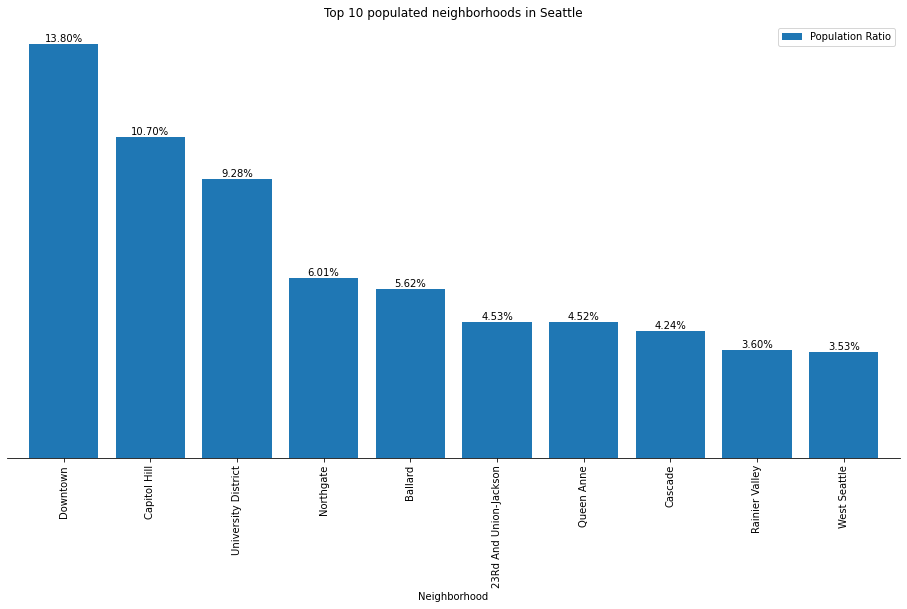

In [179]:
# Printing a bar chart of Seattle's neighborhoods
ax = df_seattle_top10.plot(kind='bar', x='NAME', y='Population_Ratio', figsize=(16,8), width=0.8)

ax.set_title('Top 10 populated neighborhoods in Seattle')
ax.set_xticklabels(df_seattle_top10.NAME, rotation=90)
ax.set_yticklabels([])
ax.set_xlabel('Neighborhood')

# Hide the right, top, and left spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)

# Hide the tick marks
ax.tick_params(right=False, left=False, top=False)

ax.legend(['Population Ratio'])

rects = ax.patches

for rect in rects:
    width = rect.get_width()
    height = rect.get_height()
    ax.annotate("{:.2%}".format(height), xy=[rect.get_x() + width / 2, height],
                ha='center',
                va='bottom',
                fontsize=10)

plt.show()

### Reading Seattle Employment Data

In [180]:
# Importing the employement data per neighborhood in Seattle
csv_employ = 'Seattle_Employement_Data.csv'

df_employ = pd.read_csv(csv_employ)

df_employ.head()

,Neighborhood,YR_2018,Job_17_18
0,12th Avenue,5605,134
1,23rd & Union-Jackson,5636,792
2,Admiral,1418,-103
3,Aurora-Licton Springs,2361,-14
4,Ballard,8081,544


In [181]:
# Renaming neighborhoods to match the geojson
df_employ['Neighborhood'] = df_employ['Neighborhood'].replace({'23Rd & Union-Jackson': '23Rd And Union-Jackson',
'Admiral': 'West Seattle', 'Aurora-Licton Springs': 'Northgate', 'Ballard-Interbay-Northend': 'Ballard',
'Belltown': 'Downtown', 'Bitter Lake Village': 'Bitter Lake', 'Chinatown-International District': 'International District',
'Columbia City': 'Rainier Valley', 'Commercial Core': 'Downtown', 'Denny Triangle': 'Central Area', 'Eastlake': 'Cascade',
'First Hill': 'Downtown', 'First Hill/Capitol Hill': 'Capitol Hill', 'Greater Duwamish': 'Georgetown',
'Greenwood-Phinney Ridge': 'Phinney Ridge', 'Madison-Miller':'Capitol Hill', 'Morgan Junction': 'West Seattle',
'Mt Baker': 'Rainier Valley', 'North Beacon Hill': 'Beacon Hill', 'Pike/Pine': 'Pike-Market', 'Pioneer Square': 'Downtown',
'Rainier Beach': 'Rainier Valley', 'South Lake Union': 'Cascade', 'University Campus': 'University District',
'University District Northwest': 'University District', 'Upper Queen Anne': 'Queen Anne', 'Uptown': 'Queen Anne',
'West Seattle Junction': 'West Seattle', 'Westwood-Highland Park': 'Highland Park'})

In [197]:
# Creating the top 10 neighborhoods with more employement
df_employ['Neighborhood'] = df_employ['Neighborhood'].str.title()
df_employ.rename({'YR_2018': 'Employees'}, axis=1, inplace=True)

# Standardizing the values in order to conform a normalize df
df_employ = df_employ.groupby('Neighborhood')[['Neighborhood', 'Employees']].sum().reset_index()

df_employ['Employment_Ratio'] = df_employ['Employees'].div(df_employ['Employees'].sum())

df_employ_top10 = df_employ.sort_values('Employees', ascending=False, ignore_index=True).head(10)

df_employ_top10.head()

,Neighborhood,Employees,Employment_Ratio
0,Downtown,352893,0.407099
1,Outside Villages,94752,0.109306
2,University District,68087,0.078545
3,Cascade,67773,0.078183
4,Georgetown,66920,0.077199


In [404]:
# Creating the unemployment ratio in the city of Seattle: df_unemp
if df_census.shape==df_employ.shape:
    print("Shapes of df_census and df_employ match!", df_census.shape)
else:
    print("Review Neighborhoods, shapes do not match :(")

df_merged = df_census.merge(df_employ, left_on='NAME', right_on='Neighborhood') # merge df_census & df_employ

# dropping unnecessary columns
df_merged = df_merged[['Neighborhood', 'Population_Ratio', 'Employment_Ratio']]

df_merged.head()

Shapes of df_census and df_employ match! (29, 3)


,Neighborhood,Population_Ratio,Employment_Ratio
0,12Th Avenue,0.021644,0.006466
1,Ballard,0.056210,0.028133
2,Beacon Hill,0.013890,0.001496
3,Bitter Lake,0.020466,0.005093
4,Capitol Hill,0.107021,0.060072


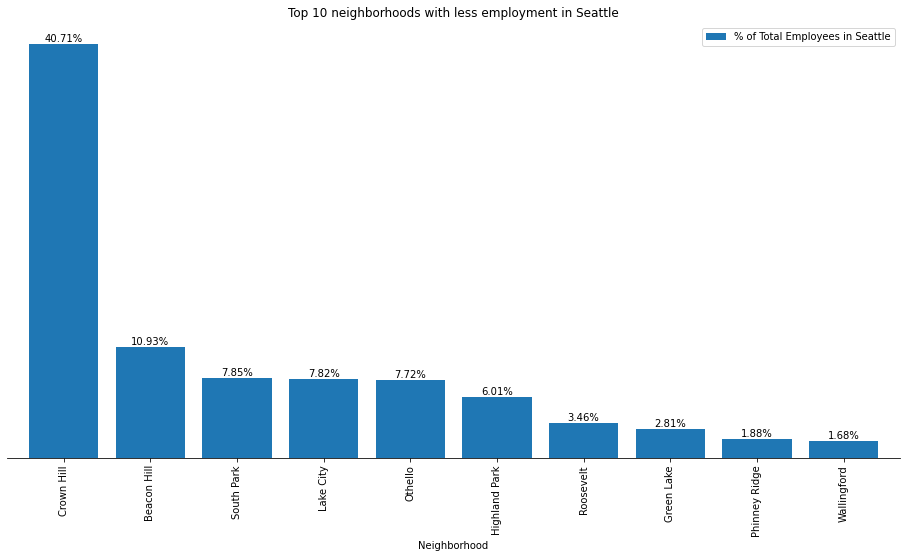

In [199]:
# Printing a bar chart of Seattle's employement
ax = df_employ_top10.plot(kind='bar', x='Neighborhood', y='Employment_Ratio', figsize=(16,8), width=0.8)

ax.set_title('Top 10 neighborhoods with less employment in Seattle')
ax.set_xticklabels(df_unemploy_top10.Neighborhood, rotation=90)
ax.set_yticklabels([])
ax.set_xlabel('Neighborhood')

# Hide the right, top, and left spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)

# Hide the tick marks
ax.tick_params(right=False, left=False, top=False)

ax.legend(['% of Total Employees in Seattle'])

rects = ax.patches

for rect in rects:
    width = rect.get_width()
    height = rect.get_height()
    ax.annotate("{:.2%}".format(height), xy=[rect.get_x() + width / 2, height],
                ha='center',
                va='bottom',
                fontsize=10)

plt.show()

#### Creating a Choropleth map for the population of the city of Seattle using folium

First, it will be needed to define the coordinates of the city of Seattle

In [221]:
longitude = 47.508013
latitude = -122.335167

# Reading the geojson it will be used for the city
geojson = 'seattle-neighborhoods.geojson' # geojson file

In [222]:
# Creating the choropleth map to see the population rate per neighborhood in Seattle
st_map_pop = folium.Map(location=[longitude, latitude], zoom_start=10)

st_map_pop.choropleth(
    geo_data=geojson,
    data=df_census,
    columns=['NAME', 'Population_Ratio'],
    key_on='feature.properties.nhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Population rate in Seattle (%)',
    reset=True
)

st_map_pop

#### Creating a Choropleth map for the employment of the city of Seattle using folium

In [203]:
st_map_employ = folium.Map(location=[longitude, latitude], zoom_start=10)

st_map_employ.choropleth(
    geo_data=geojson,
    data=df_employ,
    columns=['Neighborhood', 'Employment_Ratio'],
    key_on='feature.properties.nhood',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Employment rate in Seattle (%)',
    reset=True
)

st_map_employ

Comparing both maps we can determine that the Employment ratio in Seattle relies on the population rate of the city. Let's have a look at the correlation of both parameters.

#### Correlation between the Population_Ratio and the Employment_Ratio in the city of Seattle

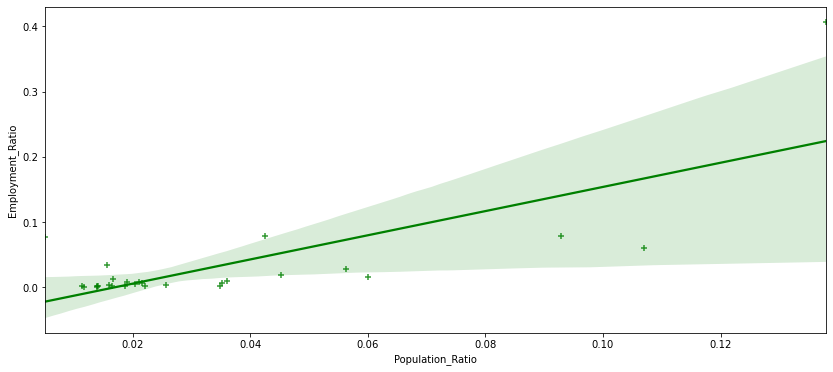

In [218]:
plt.figure(figsize=(14, 6))
ax = sns.regplot(x='Population_Ratio', y='Employment_Ratio', data=df_merged, color='green', marker='+')

### Reading Seattle Fire 911 Calls Data

In [240]:
# Importing the Fire 911 Calls data in Seattle
csv_fire = 'Seattle_Real_Time_Fire_911_Calls_Last500.csv'

df_fire = pd.read_csv(csv_fire)

df_fire.head()

,Incident Number,Latitude,Longitude,Emergency_Type,Datetime
0,F200102616,47.559123,-122.351705,AFA4 - Auto Alarm 2 + 1 + 1,2020-10-15 12:31:00
1,F200102615,47.565260,-122.353046,AFA4 - Auto Alarm 2 + 1 + 1,2020-10-15 12:30:00
2,F200102613,47.696810,-122.327101,Aid Response,2020-10-15 12:28:00
3,F200102611,47.670909,-122.382150,Auto Fire Alarm,2020-10-15 12:27:00
4,F200102609,47.602114,-122.330809,Low Acuity Response,2020-10-15 12:24:00


#### Days with the most Fire 911 Calls incidents in Seattle

In [243]:
# Defining a new date column
df_fire['Datetime'] = pd.to_datetime(df_fire.Datetime)
df_fire['Date'] = df_fire.Datetime.dt.date
df_fire['Count_fire'] = 1
df_fire.head()

,Incident Number,Latitude,Longitude,Emergency_Type,Datetime,Date,Count_fire
0,F200102616,47.559123,-122.351705,AFA4 - Auto Alarm 2 + 1 + 1,2020-10-15 12:31:00,2020-10-15,1
1,F200102615,47.565260,-122.353046,AFA4 - Auto Alarm 2 + 1 + 1,2020-10-15 12:30:00,2020-10-15,1
2,F200102613,47.696810,-122.327101,Aid Response,2020-10-15 12:28:00,2020-10-15,1
3,F200102611,47.670909,-122.382150,Auto Fire Alarm,2020-10-15 12:27:00,2020-10-15,1
4,F200102609,47.602114,-122.330809,Low Acuity Response,2020-10-15 12:24:00,2020-10-15,1


#### Creating a Waffle to show the number of incident calls

In [251]:
# Grouping Data
df_fire_all = df_fire.groupby('Date')['Count_fire'].sum().reset_index()

df_fire_all

,Date,Count_fire
0,2020-10-13,179
1,2020-10-14,236
2,2020-10-15,85


<img>fire.png</img>

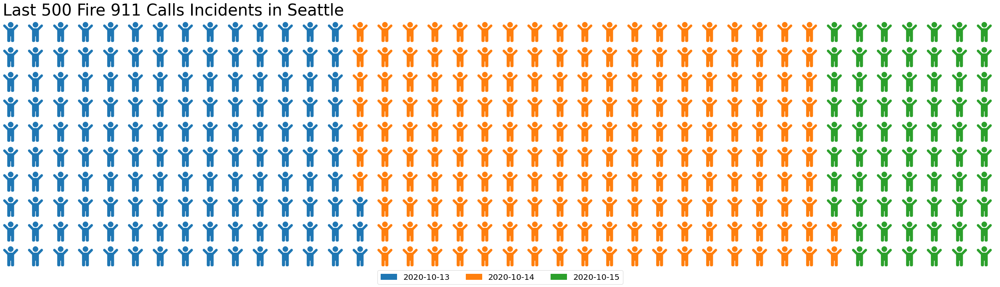

In [293]:
from pywaffle import Waffle

### Preparing the data for the Waffle Chart###
width = 40
height = 10

# compute the proportion of each category with respect to the total
total_values = sum(df_fire_all['Count_fire'])
category_proportions = [(float(value) / total_values) for value in df_fire_all['Count_fire']]

# total number of tiles
total_num_tiles = width * height

tiles_per_category = [round(proportion * total_num_tiles) for proportion in category_proportions]

### Creating the Waffle plot ###
fig = plt.figure(FigureClass = Waffle,
                rows=10,
                values=list(tiles_per_category),
                labels=list(df_fire_all.Date.values),
                figsize=(40, 10),
                cmap_name='tab10',
                icons='child',
                icon_size=50,
                legend={'loc': 'lower center', 'bbox_to_anchor': (0.5,-0.1), 'ncol': len(df_fire_all.index), 'fontsize': 20},
                title={'label': 'Last 500 Fire 911 Calls Incidents in Seattle','loc': 'left','fontdict': {'fontsize': 40}})

#### Creating a Map with Markers for the Fire 911 Calls in Seattle

In [367]:
# create map and display it
fire_map = folium.Map(location=[47.608013, -122.335167], zoom_start=11)

# loop through the 100 crimes and add each to the map
for lat, lng, label in zip(df_fire.Latitude, df_fire.Longitude, df_fire.Emergency_Type):
    folium.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='yellow',
        fill=True,
        popup=label,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(fire_map)

# show map
fire_map

### Reading SPD Crime Data

In [370]:
# Importing the crime data in Seattle
csv_crime = 'SPD_Crime_Data_2020_Last500.csv'

df_crime = pd.read_csv(csv_crime)

df_crime.head()

,Offense ID,MCPP,Longitude,Latitude,Crime Against Category,Offense Parent Group,Offense
0,12605873663,MAGNOLIA,-122.385974,47.649387,SOCIETY,DRUG/NARCOTIC OFFENSES,Drug/Narcotic Violations
1,12605598696,ROOSEVELT/RAVENNA,-122.323399,47.675118,PROPERTY,LARCENY-THEFT,Theft of Motor Vehicle Parts or Accessories
2,12605567653,ROOSEVELT/RAVENNA,-122.299552,47.666384,PROPERTY,ROBBERY,Robbery
3,12605174036,MAGNOLIA,-122.384865,47.642927,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property
4,12605097782,NORTH BEACON HILL,-122.314719,47.580248,PROPERTY,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,Destruction/Damage/Vandalism of Property


#### Creating a Word Cloud to show the most common crimes in Seattle

The Wordcloud will use the Offense_Type data from the df_crime dataframe. Moreover, it will be printed on a Seattle Map mask.

In [373]:
# Grouping Data to show the summary
df_crime_summ = df_crime['Offense Parent Group'].value_counts().to_frame().reset_index()

df_crime_summ.columns = ['Offense_Type', 'Number_Crimes']

df_crime_summ

,Offense_Type,Number_Crimes
0,LARCENY-THEFT,292
1,DESTRUCTION/DAMAGE/VANDALISM OF PROPERTY,57
2,MOTOR VEHICLE THEFT,40
3,FRAUD OFFENSES,34
4,DRIVING UNDER THE INFLUENCE,22
5,ROBBERY,15
6,DRUG/NARCOTIC OFFENSES,11
7,COUNTERFEITING/FORGERY,6
8,EXTORTION/BLACKMAIL,5
9,SEX OFFENSES,5


In [374]:
crime_words = df_crime_summ.Offense_Type.to_string(index=False)

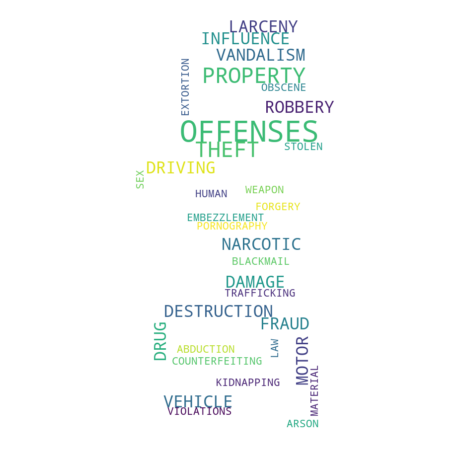

In [375]:
from wordcloud import WordCloud
from PIL import Image

# save mask to seattle_mask
seattle_mask = np.array(Image.open('images/seattle.jpg'))

# instantiate a word cloud object
crime_wc = WordCloud(
    background_color='white',
    max_words=2000,
    mask=seattle_mask
)

# generate the word cloud
crime_wc.generate(crime_words)

# display the word cloud
fig = plt.figure()
fig.set_figwidth(8) # set width
fig.set_figheight(16) # set height

# display the word cloud
plt.imshow(crime_wc, interpolation='bilinear')
plt.axis('off')
plt.show()

#### Creating a cluster map plot for the Crimes commited in Seattle

In [402]:
from folium import plugins

# let's start again with a clean copy of the map of San Francisco
crimes_map = folium.Map(location = [47.608013, -122.335167], zoom_start = 11)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(crimes_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label in zip(df_crime.Latitude, df_crime.Longitude, df_crime.Offense):
    folium.Marker(
        location=[lat, lng],
        icon=folium.Icon(color='black', icon='gavel', prefix='fa'), # icon list from "fontawesome.com" (prefix='fa' needed)
        popup=label,
    ).add_to(incidents)

# display map
crimes_map

## Plotting Relational Maps in Seattle

In this section, the previous maps exposed will be merged in order to find more insightful conclusions. Therefore, two maps will be plotted according to the estimated relation that some factors can have:

- <b>Population map</b> (Choropleth map) + <b>Fire map</b> (Map with Markers).


- <b>Employment map</b> (Choropleth map) + <b>Crime map</b> (Cluster Map).

### Fire 911 Calls reported in Seattle: Plotted on the population choropleth map

### SPD Crimes reported in Seattle. Plotted on the employement choropleth map

## Process to cluster neighborhoods in Toronto based on top venues

After cleaning the dataset and defining a new df (df_seattle), we will start exploring and analysing the df venues
- Exploring each neighborhood in Seattle

    - Cleaning the dataset
    
    - Defining the 'getNearbyVenues' function to obtain all the data from venues
    
    - Define the credentials to Foursquare
     
     
- Getting the venues per neighborhood

    - Analyse each neighborhood: Top 10 venues
    
    
- Clustering Seattle's neighborhoods

    - Examine Seattle's clusters

In [447]:
# Conforming the new df_seattle from the df_crime
df_seattle = df_crime[['MCPP', 'Latitude', 'Longitude']]

filt = ['COLUMBIA CITY'] # dropping neighborhoods causing problems

df_seattle = df_seattle[~(df_seattle.MCPP.isin(filt))]

df_seattle = df_seattle.groupby('MCPP')[['Latitude', 'Longitude']].mean().reset_index()

df_seattle.columns = ['Neighborhood', 'Latitude', 'Longitude']

df_seattle

,Neighborhood,Latitude,Longitude
0,ALASKA JUNCTION,47.562184,-122.381861
1,BALLARD NORTH,47.685104,-122.381090
2,BALLARD SOUTH,47.666123,-122.375963
3,BELLTOWN,47.614665,-122.347269
4,BITTERLAKE,40.901226,-104.875726
5,BRIGHTON/DUNLAP,47.539042,-122.274242
6,CAPITOL HILL,47.616751,-122.322669
7,CENTRAL AREA/SQUIRE PARK,43.949034,-112.896208
8,CHINATOWN/INTERNATIONAL DISTRICT,47.598702,-122.322905
9,CLAREMONT/RAINIER VISTA,47.572919,-122.294006


In [448]:
# Defining the function to obtain nearby venues: getNearbyVenues
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [449]:
# Defining the credentials needed to read the venues from Foursquare:
CLIENT_ID = 'ANNV5QVQNPQPHJWUIR1J2YAQ44WIIBFLJYP512NF1PG0WSRD' # your Foursquare ID
CLIENT_SECRET = '3JQHTEPR1ZQS02ZUYFOLLMH5ZXY1UIVYMJJKT14LL1OSYARG' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: ANNV5QVQNPQPHJWUIR1J2YAQ44WIIBFLJYP512NF1PG0WSRD
CLIENT_SECRET:3JQHTEPR1ZQS02ZUYFOLLMH5ZXY1UIVYMJJKT14LL1OSYARG


#### Getting the venues per Neighborhood

In [450]:
# Getting the venues with the pre-defined function using 'PostalCode'
seattle_venues = getNearbyVenues(df_seattle.Neighborhood, df_seattle.Latitude, df_seattle.Longitude, radius=500)

ALASKA JUNCTION
BALLARD NORTH
BALLARD SOUTH
BELLTOWN
BITTERLAKE
BRIGHTON/DUNLAP
CAPITOL HILL
CENTRAL AREA/SQUIRE PARK
CHINATOWN/INTERNATIONAL DISTRICT
CLAREMONT/RAINIER VISTA
DOWNTOWN COMMERCIAL
EASTLAKE - WEST
FIRST HILL
FREMONT
GEORGETOWN
GREENWOOD
HIGH POINT
HIGHLAND PARK
HILLMAN CITY
JUDKINS PARK/NORTH BEACON HILL
LAKEWOOD/SEWARD PARK
MADISON PARK
MADRONA/LESCHI
MAGNOLIA
MID BEACON HILL
MILLER PARK
MONTLAKE/PORTAGE BAY
MORGAN
MOUNT BAKER
NEW HOLLY
NORTH ADMIRAL
NORTH BEACON HILL
NORTH DELRIDGE
NORTHGATE
PHINNEY RIDGE
PIGEON POINT
PIONEER SQUARE
QUEEN ANNE
RAINIER BEACH
RAINIER VIEW
ROOSEVELT/RAVENNA
ROXHILL/WESTWOOD/ARBOR HEIGHTS
SANDPOINT
SLU/CASCADE
SODO
SOUTH BEACON HILL
SOUTH DELRIDGE
SOUTH PARK
UNIVERSITY
WALLINGFORD


In [451]:
print(seattle_venues.shape)
seattle_venues.head()

(1323, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,ALASKA JUNCTION,47.562184,-122.381861,Trader Joe's,47.561874,-122.380820,Grocery Store
1,ALASKA JUNCTION,47.562184,-122.381861,Chaco Canyon Organic Cafe,47.561253,-122.380138,Vegetarian / Vegan Restaurant
2,ALASKA JUNCTION,47.562184,-122.381861,Sound & Fog,47.560071,-122.382934,Coffee Shop
3,ALASKA JUNCTION,47.562184,-122.381861,West Seattle Bowl,47.562511,-122.381805,Bowling Alley
4,ALASKA JUNCTION,47.562184,-122.381861,Realfine Coffee,47.563465,-122.378396,Coffee Shop


In [452]:
seattle_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
ALASKA JUNCTION,63,63,63,63,63,63
BALLARD NORTH,16,16,16,16,16,16
BALLARD SOUTH,92,92,92,92,92,92
BELLTOWN,94,94,94,94,94,94
BRIGHTON/DUNLAP,17,17,17,17,17,17
CAPITOL HILL,100,100,100,100,100,100
CHINATOWN/INTERNATIONAL DISTRICT,42,42,42,42,42,42
CLAREMONT/RAINIER VISTA,19,19,19,19,19,19
DOWNTOWN COMMERCIAL,100,100,100,100,100,100


In [453]:
# How many unique categories are there?
print('There are {} unique categories.'.format(len(seattle_venues['Venue Category'].unique())))

There are 267 unique categories.


#### Analyzing each of the Neighborhoods

In [454]:
# one hot encoding
seattle_onehot = pd.get_dummies(seattle_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
seattle_onehot['Neighborhood'] = seattle_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [seattle_onehot.columns[-1]] + list(seattle_onehot.columns[:-1])
seattle_onehot = seattle_onehot[fixed_columns]

seattle_onehot.head()

,Zoo Exhibit,ATM,Adult Boutique,African Restaurant,Airport,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,...,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [457]:
# Grouping each neighborhood by taking the mean of the frequency of occurrence of each category 
seattle_grouped = seattle_onehot.groupby('Neighborhood').mean().reset_index()
seattle_grouped.head()

,Neighborhood,Zoo Exhibit,ATM,Adult Boutique,African Restaurant,Airport,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,...,Vietnamese Restaurant,Warehouse Store,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,ALASKA JUNCTION,0.0,0.0,0.0,0.0,0.0,0.0,0.015873,0.0,0.0,...,0.000000,0.00000,0.0,0.0,0.00000,0.0,0.00000,0.0,0.0,0.015873
1,BALLARD NORTH,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.00000,0.0,0.0,0.00000,0.0,0.00000,0.0,0.0,0.000000
2,BALLARD SOUTH,0.0,0.0,0.0,0.0,0.0,0.0,0.010870,0.0,0.0,...,0.021739,0.01087,0.0,0.0,0.01087,0.0,0.01087,0.0,0.0,0.010870
3,BELLTOWN,0.0,0.0,0.0,0.0,0.0,0.0,0.031915,0.0,0.0,...,0.021277,0.00000,0.0,0.0,0.00000,0.0,0.00000,0.0,0.0,0.000000
4,BRIGHTON/DUNLAP,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.00000,0.0,0.0,0.00000,0.0,0.00000,0.0,0.0,0.000000


Introducing this data into a pandas dataframe

In [458]:
# Defining a function to order the venues in descending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [459]:
# Defining the n top venues and sorting them 
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = seattle_grouped['Neighborhood']

for ind in np.arange(seattle_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(seattle_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALASKA JUNCTION,Pizza Place,Coffee Shop,Gym,Asian Restaurant,BBQ Joint,Mexican Restaurant,Burger Joint,Brewery,Furniture / Home Store,Beer Store
1,BALLARD NORTH,Food Truck,Convenience Store,Athletics & Sports,Rental Car Location,Restaurant,Bus Stop,Smoke Shop,Soccer Field,Mexican Restaurant,Furniture / Home Store
2,BALLARD SOUTH,Brewery,Coffee Shop,Automotive Shop,Food Truck,Sandwich Place,Bar,Gaming Cafe,Thrift / Vintage Store,Pizza Place,Clothing Store
3,BELLTOWN,Bar,Coffee Shop,Sushi Restaurant,Pizza Place,Gym,American Restaurant,Hotel,Breakfast Spot,Marijuana Dispensary,Cocktail Bar
4,BRIGHTON/DUNLAP,Mexican Restaurant,Gym,Home Service,Fast Food Restaurant,Tex-Mex Restaurant,Seafood Restaurant,Gas Station,Light Rail Station,Bus Line,Park


## References

Here you can find all the links to the datasources that were used to conform the 4 datasets used in this project:

(1) [Seattle neighborhoods boundaries data](https://github.com/seattleio/seattle-boundaries-data)

(2) [Seattle population data (Census 2010)](https://catalog.data.gov/dataset/urban-centers-villages-census-data-2010)

(3) [Seattle Employement, Fire 911 Calls, and Crime Data](https://data.seattle.gov/)

(4) [Foursquare API](https://developer.foursquare.com/)

<hr>

Created on 2020 by [Carlos Espejo](https://github.com/caresppen).